In this notebook I view the detections of the pre-trained tfLite efficientDel-Lite networks I re-trained on climbing holds in `01_TFlite_EfficientDet-Lite_train_hold_detection.ipynb`

Info: https://www.tensorflow.org/lite/guide/inference  
Scroll to  - Load and run a model in Python

In [1]:
import pandas as pd
import numpy as np

from tflite_model_maker import model_spec
from tflite_model_maker import object_detector

import tensorflow as tf

import cv2
from PIL import Image
import os

from skimage import io
import matplotlib.pyplot as plt

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [2]:
# Get list of test images:

csv_name = 'training_climbing_hall_sameLabelAllHolds.csv'

df = pd.read_csv(csv_name)
test_imgs = df[df.set=='TEST']["path"].str.split('holds/').str[1].unique()
test_imgs

array(['0007.jpg', '0008.jpg', '0009.jpg', '0023.jpg', '0024.jpg',
       '0027.jpg', '0029.jpg', '0036.jpg', '0056.jpg', '0058.jpg',
       '0060.jpg', '0063.jpg', '0071.jpg', '0109.jpg', '0140.jpg'],
      dtype=object)

Adjust the `DETECTION_THRESHOLD` to change the sensitivity of the model.  

Although it requires some of boilerplate code to run the model in Python at this moment, integrating the model into a mobile app only requires a few lines of code.

In [3]:
classes = ['label', 'climbing_hold']

def preprocess_image(image_path, input_size):
    """Preprocess the input image to feed to the TFLite model"""
    img = tf.io.read_file(image_path)
    img = tf.io.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.uint8)
    original_image = img
    resized_img = tf.image.resize(img, input_size)
    resized_img = resized_img[tf.newaxis, :]
    resized_img = tf.cast(resized_img, dtype=tf.uint8)
    return resized_img, original_image


def detect_objects(interpreter, image, threshold):
    """Returns a list of detection results, each a dictionary of object info."""

    signature_fn = interpreter.get_signature_runner()

    # Feed the input image to the model
    output = signature_fn(images=image)

    # Get all outputs from the model
    count = int(np.squeeze(output['output_0']))
    scores = np.squeeze(output['output_1'])
    classes = np.squeeze(output['output_2'])
    boxes = np.squeeze(output['output_3'])

    results = []
    for i in range(count):
        if scores[i] >= threshold:
            result = {
                'bounding_box': boxes[i],
                'class_id': classes[i],
                'score': scores[i]
            }
            results.append(result)
    return results


def run_odt_and_draw_results(image_path, interpreter, threshold=0.5):
    """Run object detection on the input image and draw the detection results"""
    # Load the input shape required by the model
    _, input_height, input_width, _ = interpreter.get_input_details()[0]['shape']

    # Load the input image and preprocess it
    preprocessed_image, original_image = preprocess_image(
        image_path,(input_height, input_width))

    # Run object detection on the input image
    results = detect_objects(interpreter, preprocessed_image, threshold=threshold)

    # Plot the detection results on the input image
    original_image_np = original_image.numpy().astype(np.uint8)
    for obj in results:
        # Convert the object bounding box from relative coordinates to absolute
        # coordinates based on the original image resolution
        ymin, xmin, ymax, xmax = obj['bounding_box']
        xmin = int(xmin * original_image_np.shape[1])
        xmax = int(xmax * original_image_np.shape[1])
        ymin = int(ymin * original_image_np.shape[0])
        ymax = int(ymax * original_image_np.shape[0])

        # Find the class index of the current object
        class_id = int(obj['class_id'])

        # Draw the bounding box and label on the image
        #color = [int(c) for c in COLORS[class_id]]
        print((xmin, ymin), (xmax, ymax))
        cv2.rectangle(original_image_np, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)
        # Make adjustments to make the label visible for all objects
        y = ymin - 15 if ymin - 15 > 15 else ymin + 15
        label = "{}: {:.0f}%".format(classes[class_id], obj['score'] * 100)
        cv2.putText(original_image_np, label, (xmin, y),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    # Return the final image
    original_uint8 = original_image_np.astype(np.uint8)
    return original_uint8

In [4]:
DETECTION_THRESHOLD = 0.4 

## iterate over models:
for i in range(0,5):
    
    model_path = f'model{i}.tflite'
    os.makedirs(os.path.join('predictions',f'model{i}'), exist_ok=True)

    # Load the TFLite model
    interpreter = tf.lite.Interpreter(model_path=model_path)
    interpreter.allocate_tensors()

    for file in test_imgs:
        TEMP_FILE = os.path.join('thesis_raw_data', file)

        # Run inference and draw detection result on the local copy of the original file
        detection_result_image = run_odt_and_draw_results(
            TEMP_FILE,
            interpreter,
            threshold=DETECTION_THRESHOLD
        )
        
        Image.fromarray(detection_result_image).save(os.path.join('predictions', f'model{i}', file))


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
2022-08-04 19:13:57.052541: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-08-04 19:13:57.786400: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 34 MB memory:  -> device: 0, name: Quadro P6000, pci bus id: 0000:03:00.0, compute capability: 6.1
2022-08-04 19:13:57.798499: I tensorflow/stream_executor/cuda/cuda_driver.cc:739] failed to allocate 34.44M (36110336 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memory
2022-08-04 19:13:57.800005: I tensorflow/stream_executor/cuda/cuda_driver.cc:739] failed to allocate 30.99M (32499456 bytes) from device: CUDA_ERROR_OUT_OF_MEMORY: out of memo

(59, 556) (102, 649)
(216, 241) (253, 331)
(276, 240) (337, 293)
(312, 166) (343, 236)
(251, 220) (296, 274)
(238, 364) (361, 437)
(19, 333) (46, 404)
(417, 553) (469, 616)
(337, 220) (367, 270)
(274, 118) (328, 175)
(145, 323) (169, 346)
(422, 183) (441, 215)
(123, 644) (143, 665)
(79, 133) (109, 166)
(183, 446) (209, 474)
(121, 272) (139, 294)
(202, 120) (262, 210)
(0, 83) (103, 237)
(114, 274) (221, 382)
(0, 365) (88, 467)
(437, 251) (475, 342)
(223, 1) (265, 56)
(215, 423) (260, 485)
(247, 354) (310, 439)
(74, 453) (174, 626)
(413, 484) (447, 522)
(287, 184) (319, 231)
(12, 137) (56, 180)
(178, 72) (200, 99)
(136, 139) (151, 160)
(171, 0) (205, 41)
(6, 185) (182, 512)
(280, 5) (339, 138)
(397, 3) (446, 55)
(1, 415) (49, 505)
(184, 87) (293, 186)
(275, 608) (332, 658)
(380, 442) (475, 539)
(392, 579) (440, 635)
(65, 518) (170, 605)
(0, 574) (30, 626)
(359, 172) (407, 215)
(298, 679) (356, 734)
(286, 134) (320, 182)
(302, 156) (363, 218)
(24, 147) (71, 192)
(411, 478) (477, 540)
(417

(147, 134) (191, 176)
(275, 208) (316, 247)
(279, 132) (328, 173)
(276, 2) (338, 60)
(171, 167) (204, 210)
(271, 259) (311, 303)
(158, 215) (225, 286)
(-1, 323) (89, 401)
(50, 207) (83, 240)
(104, 221) (148, 269)
(330, 118) (365, 144)
(5, 277) (52, 324)
(335, 180) (397, 288)
(344, 280) (399, 308)
(104, 276) (143, 328)
(267, 53) (290, 74)
(151, 45) (174, 71)
(238, 287) (265, 309)
(70, 44) (94, 70)
(58, 266) (91, 292)
(70, 77) (96, 101)
(296, 100) (315, 123)
(284, 84) (306, 103)
(314, 231) (340, 251)
(12, 346) (50, 392)


KeyboardInterrupt: 

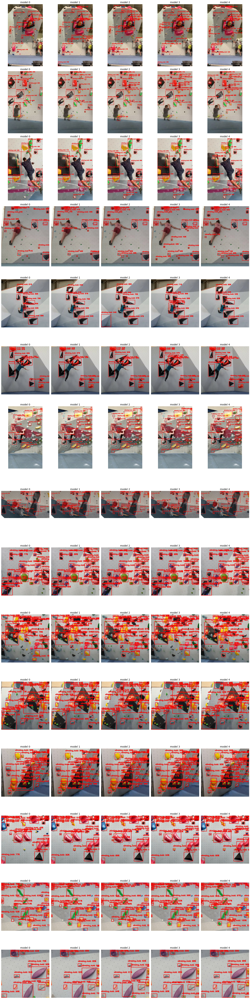

In [5]:
fig,ax = plt.subplots(len(test_imgs), 5, figsize=(20,80))

for i in range(len(test_imgs)):
    for j in range(5):
        
        img = io.imread(os.path.join('predictions', f'model{j}', test_imgs[i]))

        ax[i,j].imshow(img)
        ax[i,j].set_title(f'model {j}', fontsize = 14)
        ax[i,j].axis('off')
        
plt.tight_layout()